# The lines before the header were manually removed

In [2]:
import pandas as pd
import pickle

# Load the data
try:
    with open("data/county_clarerainfallamt.pkl", "rb") as f:
        county_clare = pickle.load(f)
except FileNotFoundError:
    county_clare = pd.read_csv("data/dly518_clare-shannonairport.csv")
    county_clare["date"] = pd.to_datetime(county_clare["date"])
    county_clare = county_clare[(county_clare["date"].dt.year >= 2018) & (county_clare["date"].dt.year <= 2022)]


In [3]:
county_clare.head().style.set_properties(subset=['date'], **{'background-color': 'dodgerblue'})

,date,maxtp,mintp,igmin,gmin,rain,cbl,wdsp,hm,ddhm,hg,sun,dos,soil,pe,evap,smd_wd,smd_md,smd_pd
26420,2018-01-01 00:00:00,9.500000,3.900000,0,2.700000,3.500000,998.800000,11.800000,24,280,37,3,0,4.900000,0.700000,0.900000,0.000000,-2.800000,-10.000000
26421,2018-01-02 00:00:00,12.300000,4.000000,0,1.100000,11.000000,994.900000,17.500000,45,230,55,0,0,5.450000,0.600000,0.900000,0.000000,-10.000000,-10.000000
26422,2018-01-03 00:00:00,9.800000,4.700000,0,3.300000,5.600000,992.800000,20.600000,35,250,52,0,0,5.575000,1.100000,1.600000,0.000000,-4.500000,-10.000000
26423,2018-01-04 00:00:00,12.100000,4.400000,0,4.900000,6.900000,987.200000,13.200000,36,280,52,2,0,5.875000,0.300000,0.400000,0.000000,-6.600000,-10.000000
26424,2018-01-05 00:00:00,8.500000,3.100000,0,0.900000,2.000000,991.800000,7.100000,15,230,21,3,0,5.125000,0.300000,0.400000,0.000000,-1.700000,-10.000000


In [4]:
county_clare = county_clare.loc[:, ~county_clare.columns.str.startswith(('ind', 'file'))]

In [5]:
county_clare[["sun","hm","ddhm"]] = county_clare[["sun","hm","ddhm"]].astype("int64")

In [6]:
# Convert multiple columns to float data type
columns_to_convert = ["gmin", "rain", "cbl", "wdsp", "soil", "pe", "evap", "smd_wd", "smd_md", "smd_pd"]
county_clare[columns_to_convert] = county_clare[columns_to_convert].astype(float)


In [7]:
print(county_clare.dtypes)

date      datetime64[ns]
maxtp            float64
mintp            float64
igmin             object
gmin             float64
rain             float64
cbl              float64
wdsp             float64
hm                 int64
ddhm               int64
hg                 int64
sun                int64
dos               object
soil             float64
pe               float64
evap             float64
smd_wd           float64
smd_md           float64
smd_pd           float64
dtype: object


In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
import numpy as np
import matplotlib.dates as mdates
features = {
    'rain': 'Precipitation Amount (mm)',
    'maxtp': 'Maximum Air Temperature (°C)',
    'mintp': 'Minimum Air Temperature (°C)',
    'gmin': '09utc Grass Minimum Temperature (°C)',
    'soil': 'Mean 10cm Soil Temperature (°C)',
    'wdsp': 'Mean Wind Speed (knots)',
    'hm': 'Highest 10 minute mean wind speed (knots)',
    'ddhm': 'Mean wind direction over 10 minutes at highest mean degree',
    'hg': 'Highest Gust (knots)',
    'cbl': 'Mean CBL Pressure (hpa)',
    'sun': 'Sunshine duration (hours)',
    'pe': 'Potential Evapotranspiration (mm)',
    'evap': 'Evaporation - calculated using Penman formula (mm)',
    'smd_wd': 'Soil Moisture Deficits for well drained soils (mm)',
    'smd_md': 'Soil Moisture Deficits for moderately drained soils (mm)',
    'smd_pd': 'Soil Moisture Deficits for poorly drained soils (mm)'
}

f, ax = plt.subplots(nrows=len(features), ncols=1, figsize=(15, 3*len(features))) 

for i, (feature, label) in enumerate(features.items()):
    sns.lineplot(x=county_clare.date, y=county_clare[feature].fillna(np.inf), ax=ax[i], color='dodgerblue')
    ax[i].set_title(f'{label}', fontsize=10)
    ax[i].set_ylabel(ylabel=label, fontsize=10)
    ax[i].set_xlim([date(2018, 1, 1), date(2022, 12, 31)])
    ax[i].xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Set major ticks format

plt.tight_layout()
plt.show()



In [42]:
county_clare = county_clare.sort_values(by='date')

# Check time intervals
county_clare['Time_Interval'] = county_clare.date - county_clare.date.shift(1)

county_clare[['date', 'Time_Interval']].head()

,date,Time_Interval
26420,2018-01-01,NaT
26421,2018-01-02,1 days
26422,2018-01-03,1 days
26423,2018-01-04,1 days
26424,2018-01-05,1 days


In [43]:
print(f"{county_clare['Time_Interval'].value_counts()}")

1 days    1825
Name: Time_Interval, dtype: int64


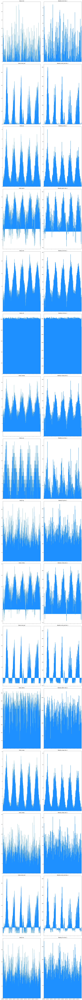

In [55]:
features = {'rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','sun','pe','evap','smd_wd','smd_md','smd_pd'}

fig, ax = plt.subplots(ncols=2, nrows=len(features), sharex=True, figsize=(16,12*len(features)))

for i, feature in enumerate(features):
    ax[i, 0].bar(county_clare.date, county_clare[feature], width=5, color='dodgerblue')
    ax[i, 0].set_title(f'Daily {feature}', fontsize=14)

    resampled_df = county_clare[['date', feature]].resample('7D', on='date').sum().reset_index(drop=False)
    ax[i, 1].bar(resampled_df.date, resampled_df[feature], width=10, color='dodgerblue')
    ax[i, 1].set_title(f'Weekly {feature} (Acc.)', fontsize=14)

    for j in range(2):
        ax[i, j].set_xlim([date(2018, 1, 1), date(2022, 12, 31)])

plt.tight_layout()
plt.show()



In [8]:
county_clare.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
maxtp,1826.0,14.308434,4.995129,-1.20,10.600,14.00,17.800,32.000
mintp,1826.0,7.424261,4.485708,-5.00,4.100,7.50,11.000,18.900
gmin,1826.0,5.940581,5.142971,-8.10,2.100,6.00,10.075,17.400
rain,1826.0,2.851369,4.475076,0.00,0.000,0.70,4.000,34.200
cbl,1826.0,1011.148521,12.149276,972.30,1003.300,1012.20,1019.775,1043.800
wdsp,1826.0,8.851917,4.060573,1.00,5.800,8.25,11.300,29.100
hm,1826.0,17.190581,6.595045,3.00,12.000,16.00,21.000,47.000
ddhm,1826.0,206.352683,85.779931,0.00,140.000,230.00,270.000,360.000
hg,1826.0,24.296824,9.697482,5.00,17.000,23.00,29.000,66.000
sun,1826.0,3.558050,3.697933,0.00,0.000,2.00,6.000,15.000


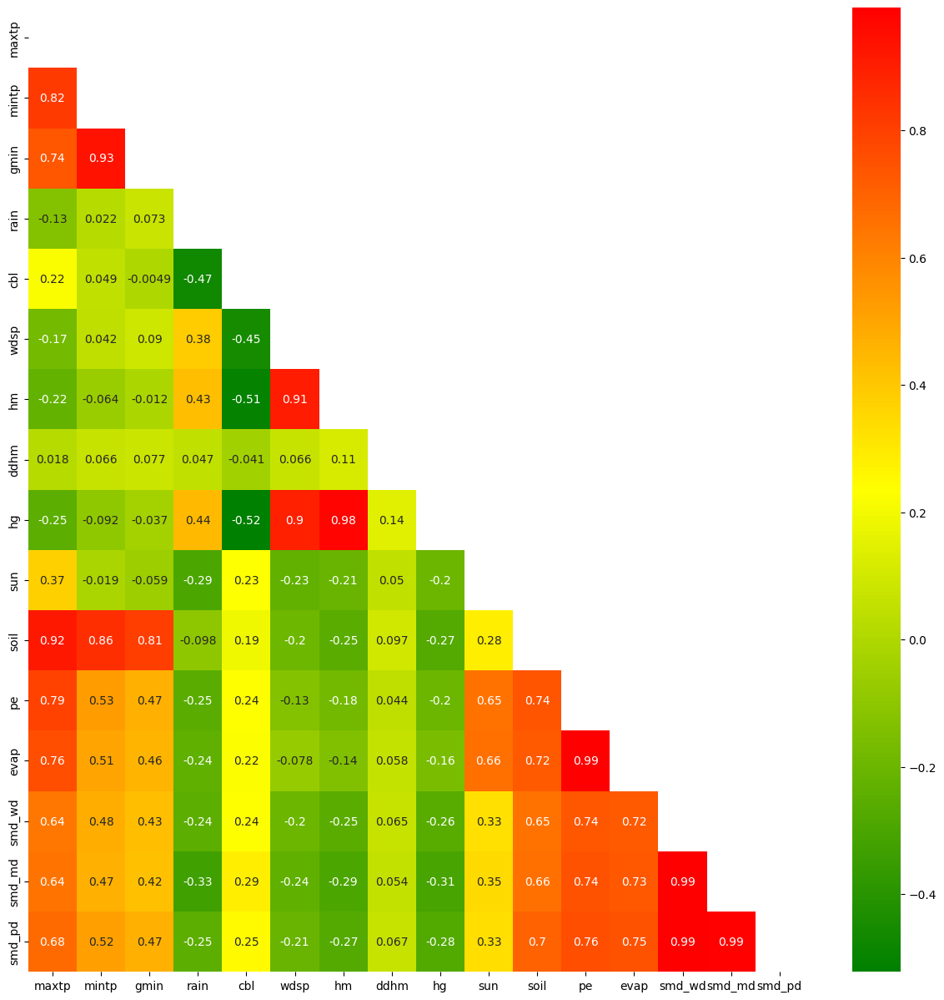

In [9]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define the colors for the colormap
colors = ['green', 'yellow', 'red']

# Create the colormap
cmap = LinearSegmentedColormap.from_list('green_yellow_red', colors)

# Plot correlation matrix for numerical variables in shanon dataset except date,ind.5,ind.4,ind.3,ind.2,ind.1
num_cols = county_clare.select_dtypes(include="number").filter(regex='^(?!ind)').columns  
corr = county_clare[num_cols].corr(method="pearson")
plt.figure(figsize=(15, 15))
# Create a lower triangular heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True,cmap=cmap)
plt.savefig("rainamtclare_heatmap_pearson.png")

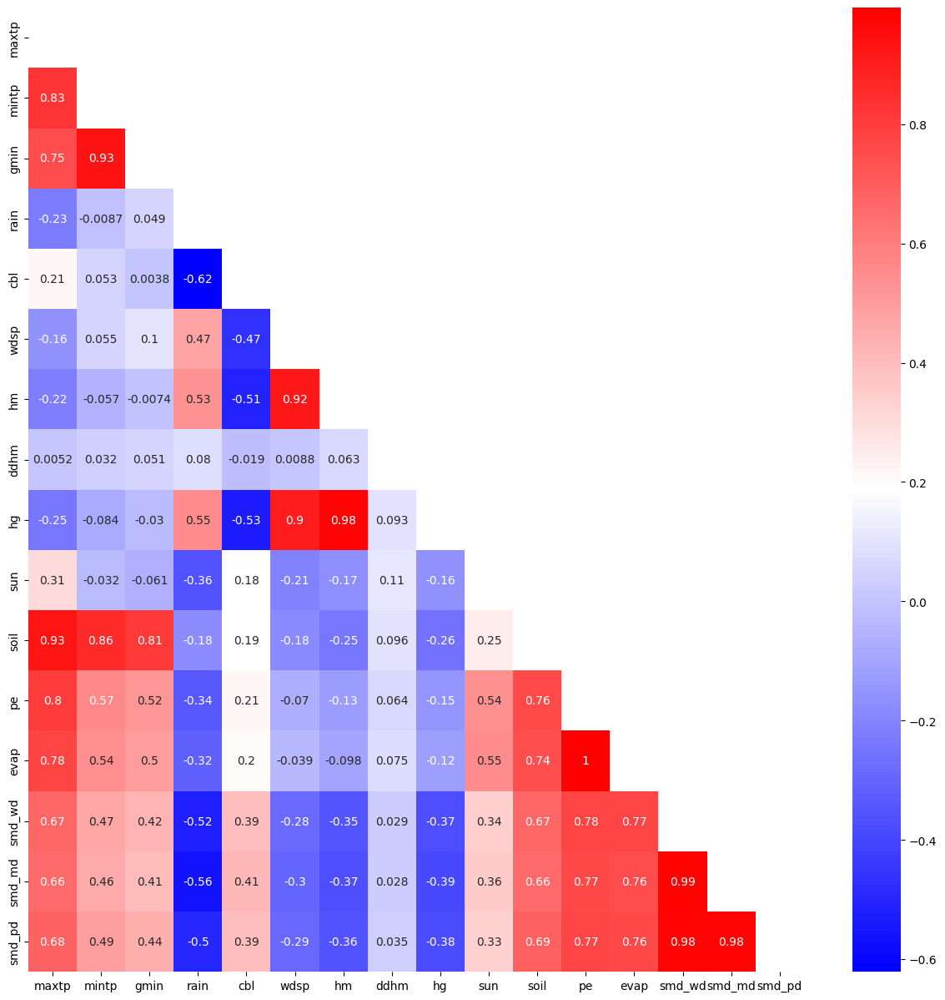

In [10]:
num_cols = county_clare.select_dtypes(include="number").filter(regex='^(?!ind)').columns     
corr = county_clare[num_cols].corr(method="spearman")
plt.figure(figsize=(15, 15))
# Create a lower triangular heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True,cmap="bwr")
plt.savefig("clare_heatmap_spearman.png")

In [12]:
with open("data/county_clare.pkl", "wb") as f:
        pickle.dump(county_clare, f)

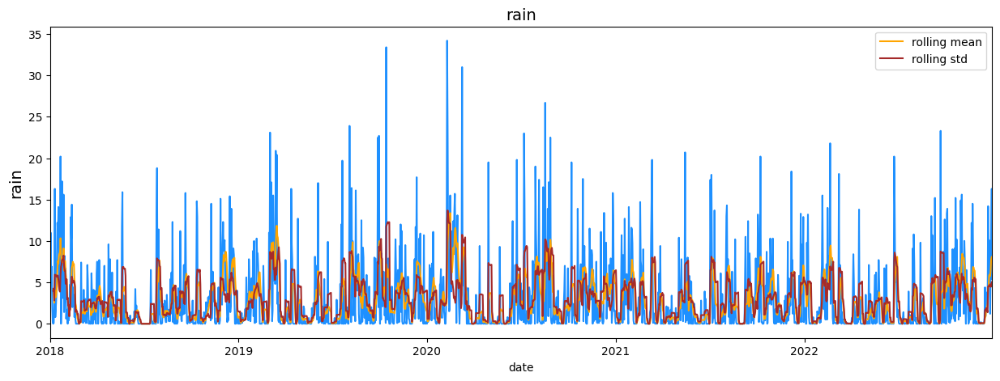

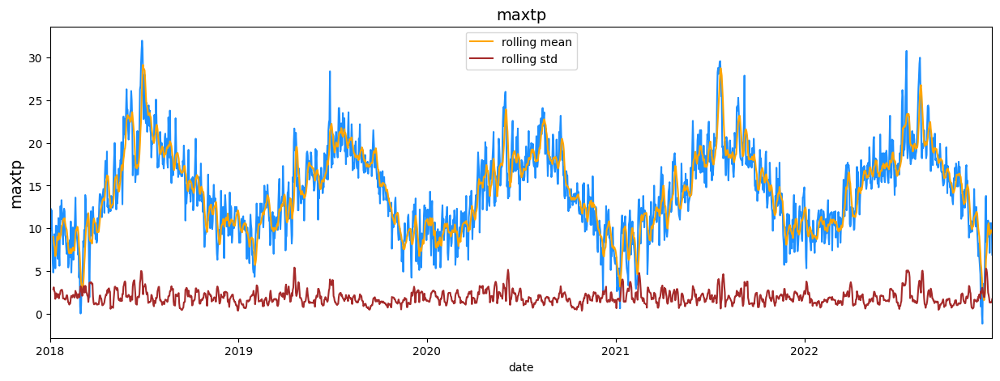

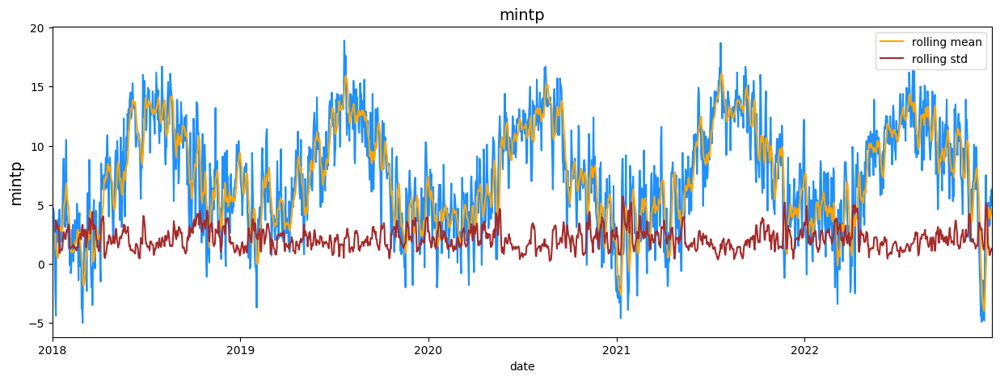

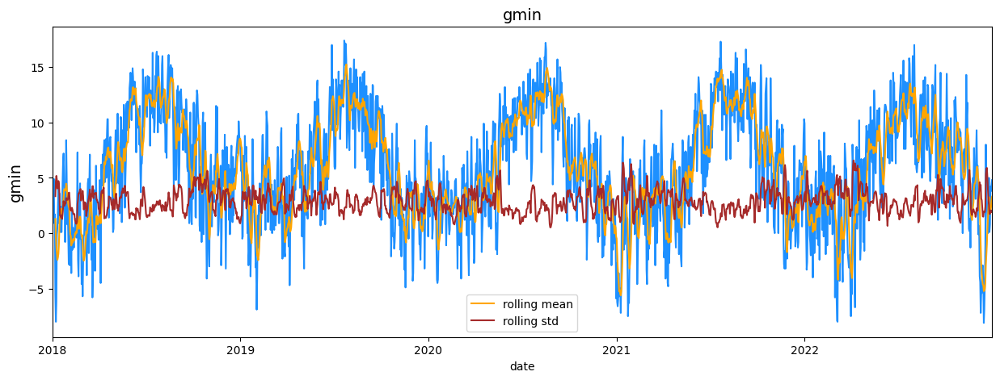

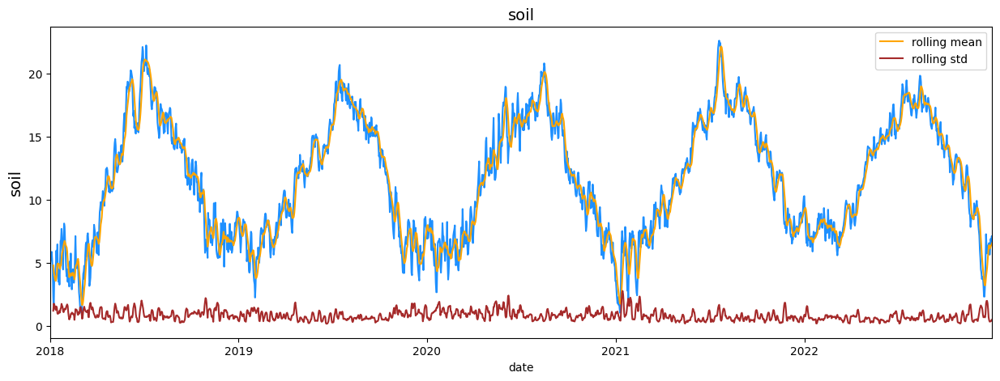

...

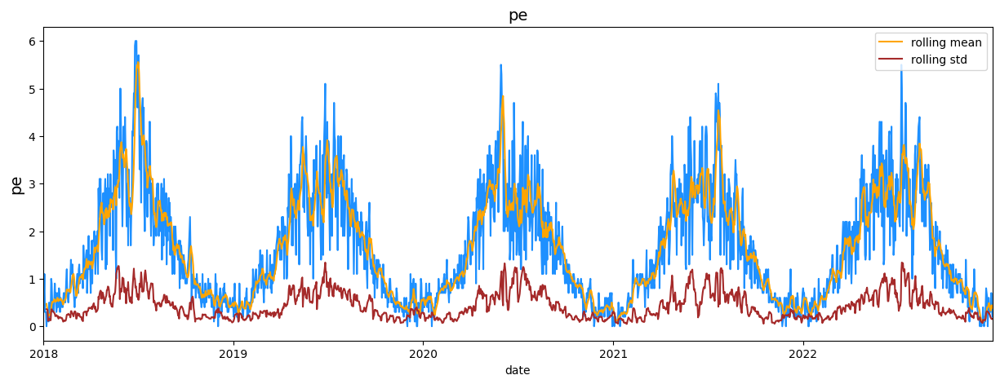

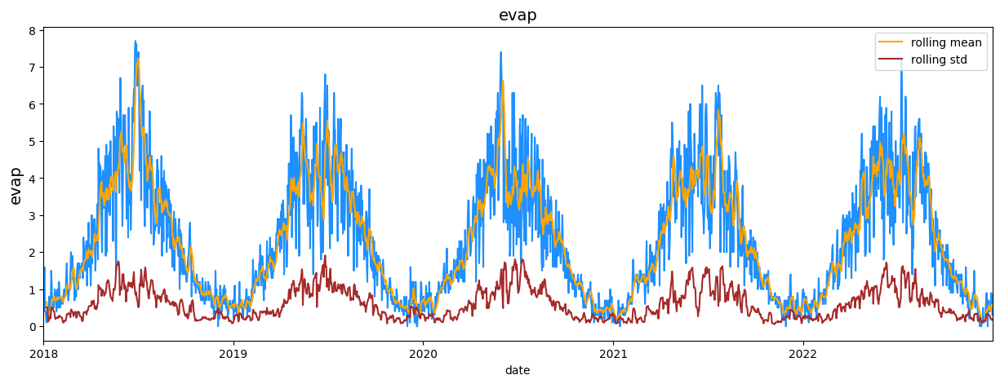

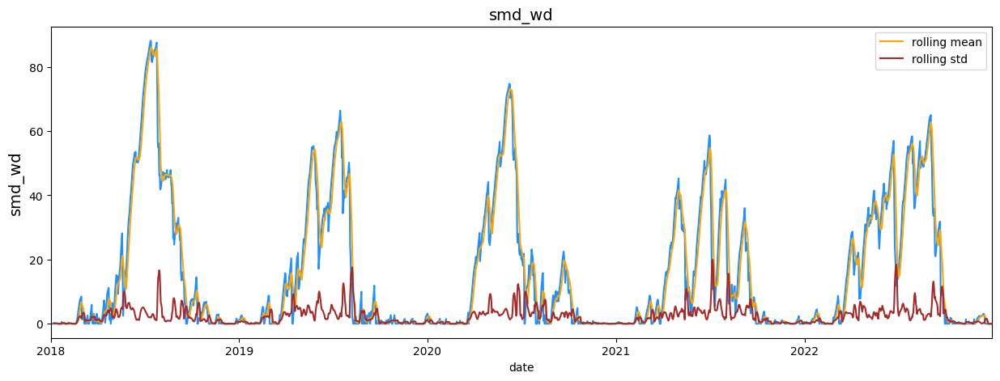

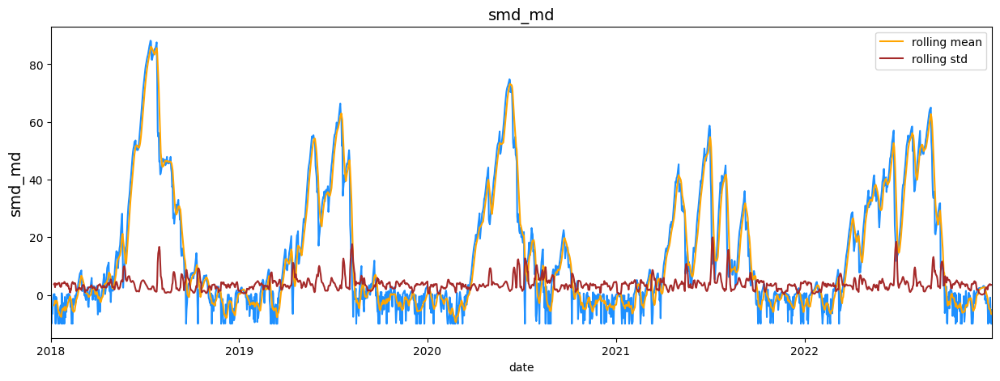

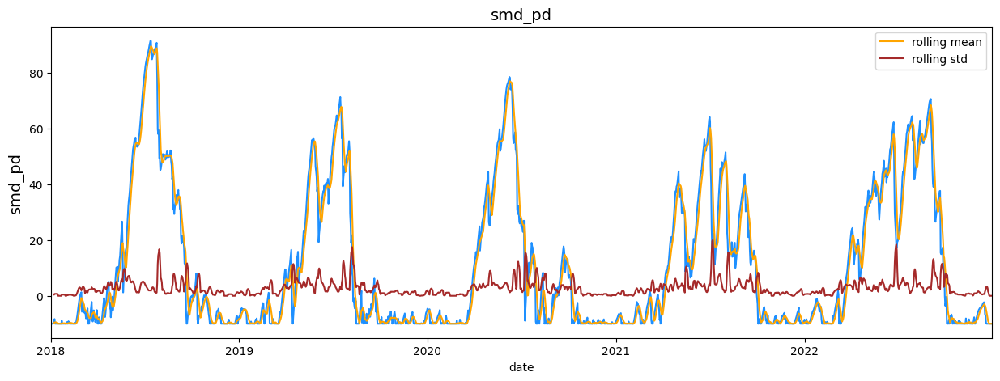

In [46]:
from datetime import date
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

rolling_window = 7
features = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','sun','pe','evap','smd_wd','smd_md','smd_pd']

for feature in features:
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 5))
    sns.lineplot(x=county_clare.date, y=county_clare[feature], ax=ax, color='dodgerblue')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).mean(), ax=ax, color='#FFA500', label='rolling mean')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).std(), ax=ax, color='brown', label='rolling std')
    ax.set_title(feature, fontsize=14)
    ax.set_ylabel(ylabel=feature, fontsize=14)
    ax.set_xlim([date(2018, 1, 1), date(2022, 12, 31)])
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location
    plt.show()


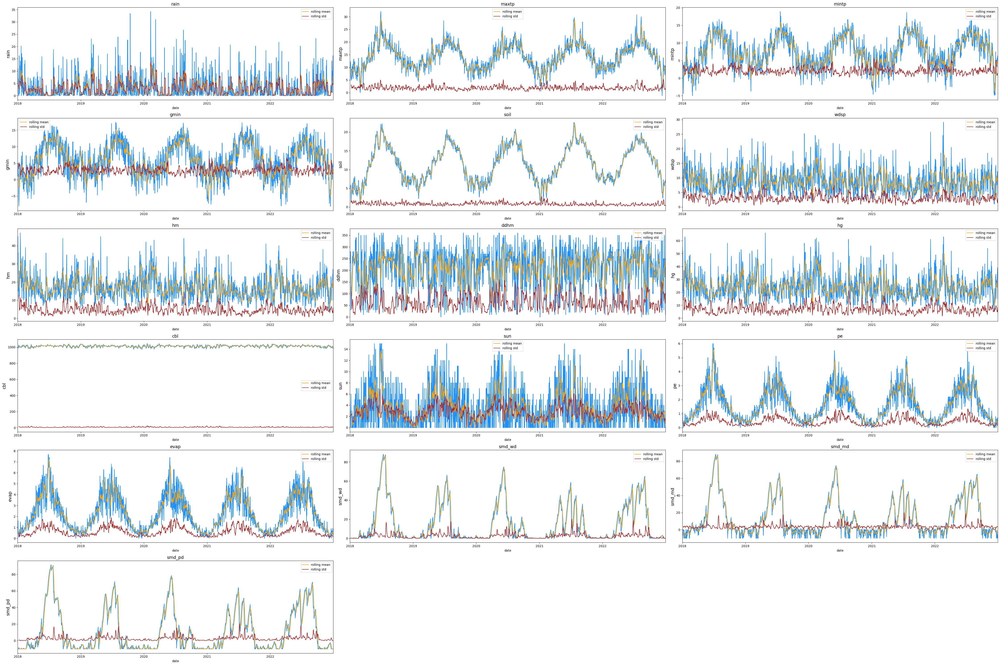

In [47]:
from datetime import date
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

rolling_window = 7
features = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','sun','pe','evap','smd_wd','smd_md','smd_pd']

# Calculate the number of rows needed for the plot
n = len(features)
n_cols = 3
n_rows = n // n_cols
n_rows += n % n_cols

# Create a figure with a size of 15x5 per subplot
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15*n_cols, 5*n_rows))

# Flatten the axes for easy iteration
axs = axs.flatten()

for i, feature in enumerate(features):
    ax = axs[i]
    sns.lineplot(x=county_clare.date, y=county_clare[feature], ax=ax, color='dodgerblue')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).mean(), ax=ax, color='#FFA500', label='rolling mean')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).std(), ax=ax, color='brown', label='rolling std')
    ax.set_title(feature, fontsize=14)
    ax.set_ylabel(ylabel=feature, fontsize=14)
    ax.set_xlim([date(2018, 1, 1), date(2022, 12, 31)])
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location

# Remove unused subplots
if n < n_rows * n_cols:
    for i in range(n, n_rows * n_cols):
        fig.delaxes(axs[i])

plt.tight_layout()
plt.show()


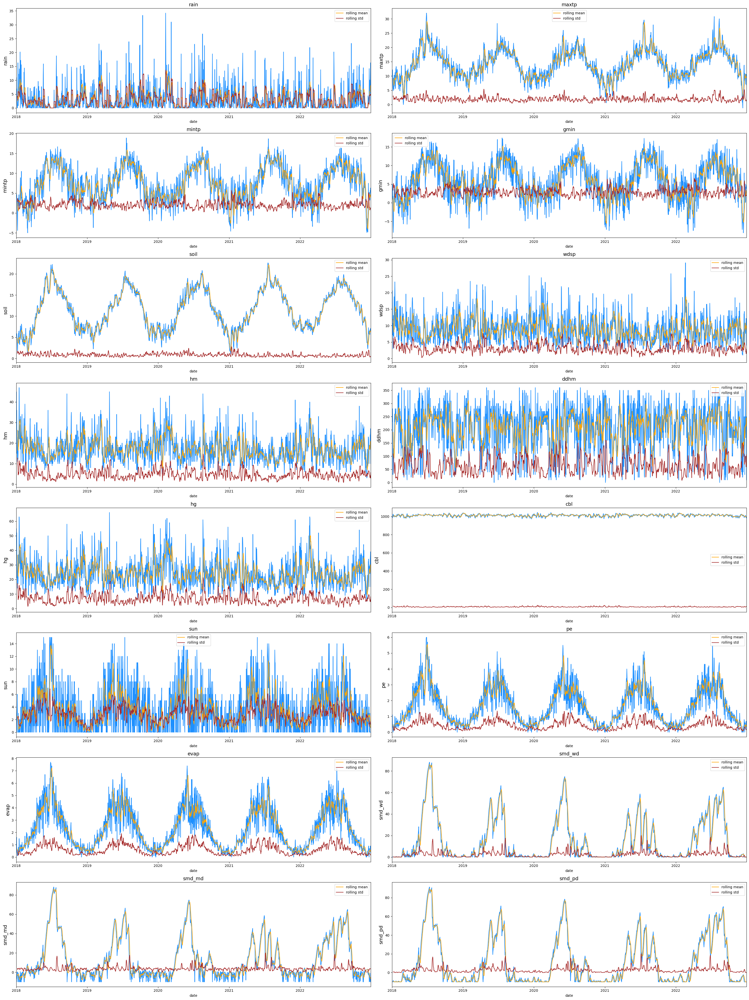

In [49]:
from datetime import date
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

rolling_window = 7
features = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','sun','pe','evap','smd_wd','smd_md','smd_pd']

# Calculate the number of rows needed for the plot
n = len(features)
n_cols = 2
n_rows = n // n_cols
n_rows += n % n_cols

# Create a figure with a size of 15x5 per subplot
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15*n_cols, 5*n_rows))

# Flatten the axes for easy iteration
axs = axs.flatten()

for i, feature in enumerate(features):
    ax = axs[i]
    sns.lineplot(x=county_clare.date, y=county_clare[feature], ax=ax, color='dodgerblue')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).mean(), ax=ax, color='#FFA500', label='rolling mean')
    sns.lineplot(x=county_clare.date, y=county_clare[feature].rolling(rolling_window).std(), ax=ax, color='brown', label='rolling std')
    ax.set_title(feature, fontsize=14)
    ax.set_ylabel(ylabel=feature, fontsize=14)
    ax.set_xlim([date(2018, 1, 1), date(2022, 12, 31)])
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location

# Remove unused subplots
if n < n_rows * n_cols:
    for i in range(n, n_rows * n_cols):
        fig.delaxes(axs[i])

plt.tight_layout()
plt.show()


In [8]:
county_clare = county_clare.drop('dos', axis=1)

In [7]:
county_clare.head()

,date,maxtp,mintp,igmin,gmin,rain,cbl,wdsp,hm,ddhm,hg,sun,soil,pe,evap,smd_wd,smd_md,smd_pd
26420,2018-01-01,9.5,3.9,0,2.7,3.5,998.8,11.8,24,280,37,3,4.900,0.7,0.9,0.0,-2.8,-10.0
26421,2018-01-02,12.3,4.0,0,1.1,11.0,994.9,17.5,45,230,55,0,5.450,0.6,0.9,0.0,-10.0,-10.0
26422,2018-01-03,9.8,4.7,0,3.3,5.6,992.8,20.6,35,250,52,0,5.575,1.1,1.6,0.0,-4.5,-10.0
26423,2018-01-04,12.1,4.4,0,4.9,6.9,987.2,13.2,36,280,52,2,5.875,0.3,0.4,0.0,-6.6,-10.0
26424,2018-01-05,8.5,3.1,0,0.9,2.0,991.8,7.1,15,230,21,3,5.125,0.3,0.4,0.0,-1.7,-10.0


In [8]:
county_clare.sort_values(by='date')
county_clare['delta'] = county_clare['date'] - county_clare['date'].shift(1)

county_clare[['date', 'delta']].head()

,date,delta
26420,2018-01-01,NaT
26421,2018-01-02,1 days
26422,2018-01-03,1 days
26423,2018-01-04,1 days
26424,2018-01-05,1 days


In [55]:
county_clare['delta'].sum(), county_clare['delta'].count()

(Timedelta('1825 days 00:00:00'), 1825)

In [56]:
county_clare = county_clare.drop('delta', axis=1)
county_clare.isna().sum()

date      0
maxtp     0
mintp     0
igmin     0
gmin      0
rain      0
cbl       0
wdsp      0
hm        0
ddhm      0
hg        0
sun       0
soil      0
pe        0
evap      0
smd_wd    0
smd_md    0
smd_pd    0
dtype: int64

In [10]:
import pandas as pd
import numpy as np
# Iterate over all columns in the DataFrame
for column_name in county_clare.columns:
    # Calculate the mean of the column, skipping over non-numeric values
    mean_value = pd.to_numeric(county_clare[column_name], errors='coerce').mean()
    # Replace values with one or more spaces with the mean of the column
    county_clare[column_name] = county_clare[column_name].replace(r'\s+', mean_value, regex=True)


In [15]:
county_clare= county_clare.replace(r'\s+', 999, regex=True)
for column in county_clare.columns:
    # get the indices of the rows that contain 777444
    indices = county_clare[county_clare[column] == 999].index.tolist()
    
    # get the date column values for those indices
    dates = county_clare.loc[indices, 'date'].tolist()
    
    # print the results
    print(f'The value of 999 occurred {len(indices)} times in {column} on the following dates: {dates}.')

The value of 999 occurred 0 times in date on the following dates: [].
The value of 999 occurred 0 times in maxtp on the following dates: [].
The value of 999 occurred 0 times in mintp on the following dates: [].
The value of 999 occurred 0 times in igmin on the following dates: [].
The value of 999 occurred 0 times in gmin on the following dates: [].
The value of 999 occurred 0 times in rain on the following dates: [].
The value of 999 occurred 0 times in cbl on the following dates: [].
The value of 999 occurred 0 times in wdsp on the following dates: [].
The value of 999 occurred 0 times in hm on the following dates: [].
The value of 999 occurred 0 times in ddhm on the following dates: [].
The value of 999 occurred 0 times in hg on the following dates: [].
The value of 999 occurred 0 times in sun on the following dates: [].
The value of 999 occurred 0 times in soil on the following dates: [].
The value of 999 occurred 0 times in pe on the following dates: [].
The value of 999 occurred

In [14]:
county_clare.loc[county_clare['date'] == '2022-09-30', 'cbl'] = county_clare['cbl'].mean()

In [16]:
with open("data/county_clarerainfallamt.pkl", "wb") as f:
        pickle.dump(county_clare, f)

In [18]:
import pickle

# Rest of the code
with open("data/county_clarerainfallamt.pkl", "rb") as f:
    county_clare = pickle.load(f)

In [19]:
county_clare.head()

,date,maxtp,mintp,igmin,gmin,rain,cbl,wdsp,hm,ddhm,hg,sun,soil,pe,evap,smd_wd,smd_md,smd_pd
26420,2018-01-01,9.5,3.9,0,2.7,3.5,998.8,11.8,24,280,37,3,4.900,0.7,0.9,0.0,-2.8,-10.0
26421,2018-01-02,12.3,4.0,0,1.1,11.0,994.9,17.5,45,230,55,0,5.450,0.6,0.9,0.0,-10.0,-10.0
26422,2018-01-03,9.8,4.7,0,3.3,5.6,992.8,20.6,35,250,52,0,5.575,1.1,1.6,0.0,-4.5,-10.0
26423,2018-01-04,12.1,4.4,0,4.9,6.9,987.2,13.2,36,280,52,2,5.875,0.3,0.4,0.0,-6.6,-10.0
26424,2018-01-05,8.5,3.1,0,0.9,2.0,991.8,7.1,15,230,21,3,5.125,0.3,0.4,0.0,-1.7,-10.0


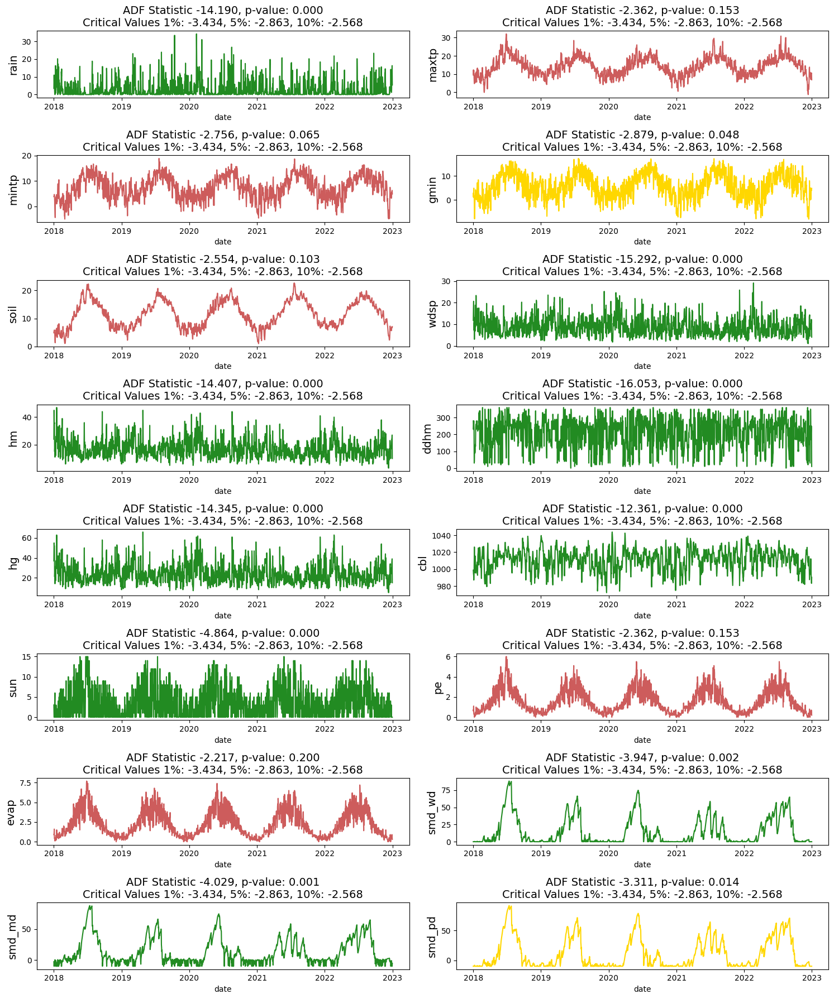

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller
fields = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','sun','pe','evap','smd_wd','smd_md','smd_pd']
f, ax = plt.subplots(nrows=8, ncols=2, figsize=(15, 18))

def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'
    sns.lineplot(x=county_clare.date, y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

for i, field in enumerate(fields):
    visualize_adfuller_results(county_clare[field].values, field, ax[i//2, i%2])

plt.tight_layout()
plt.show()


Green (forestgreen): The time series is likely stationary. This is indicated by a p-value less than the significance level (0.05) and an ADF statistic less than the critical value at the 1% level.
Gold: The time series may be stationary. This is indicated by a p-value less than the significance level (0.05) and an ADF statistic less than the critical value at the 5% level.
Orange: The time series could be stationary. This is indicated by a p-value less than the significance level (0.05) and an ADF statistic less than the critical value at the 10% level.
Red (indianred): The time series is likely non-stationary. This is indicated by a p-value greater than the significance level (0.05) or an ADF statistic greater than the critical value at the 10% level.

In [6]:
import pandas as pd
from statsmodels.tsa.stattools import kpss
# Define a function to perform KPSS Test on a series
def kpss_test(series, **kwargs):
    statistic, p_value, lags, critical_values = kpss(series, **kwargs)
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'Num Lags: {lags}')
    print('Critical Values:')
    for key, value in critical_values.items():
        print(f'  {key} : {value}')
    print('Result: The series is' + (' not' if p_value < 0.05 else '') + ' stationary')

# Perform KPSS Test on each column of the DataFrame
for column in county_clare.columns:
    print(f'\nKPSS Test for {column}:')
    kpss_test(county_clare[column], regression='c', nlags='auto')


KPSS Test for date:
KPSS Statistic: 6.622851472402865
p-value: 0.01
Num Lags: 27
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is not stationary

KPSS Test for maxtp:
KPSS Statistic: 0.10600265334534151
p-value: 0.1
Num Lags: 26
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for mintp:
KPSS Statistic: 0.13847835124273342
p-value: 0.1
Num Lags: 25
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for igmin:
KPSS Statistic: 0.09188374670575183
p-value: 0.1
Num Lags: 22
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for gmin:
KPSS Statistic: 0.07451329729288422
p-value: 0.1
Num Lags: 25
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for rain:
KPSS Statistic: 0.102411945286708

C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Step 1: Prepare the Data
# Create rain_previous_week column
county_clare['rain_previous_week'] = county_clare['rain'].shift(7)

# Extract relevant features and target variable
data = county_clare[features + [target]].copy()

# Drop rows with missing values
data.dropna(inplace=True)

# Step 2: Split the Data
X = data[features]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Build the Neural Network Model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')

# Step 4: Train the Model
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

# Step 5: Evaluate the Model
y_pred = model.predict(X_test)
mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
rmse = tf.sqrt(mse)

print("Root Mean Squared Error (RMSE):", rmse.numpy())

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

# Step 1: Prepare the Data
# Create rain_previous_day column
for i in range(1, 8):
    county_clare[f'rain_previous_day_{i}'] = county_clare['rain'].shift(i)

# Extract relevant features and target variable
features = [f'rain_previous_day_{i}' for i in range(1, 8)]
target = 'rain'
data = county_clare[features + [target]].copy()

# Drop rows with missing values
data.dropna(inplace=True)

# Step 2: Split the Data
X = data[features]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scale the data
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Step 3: Build the Neural Network Model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')

# Step 4: Train the Model
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

# Step 5: Evaluate the Model
y_pred = model.predict(X_test)
mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
rmse = tf.sqrt(mse)

print("Root Mean Squared Error (RMSE):", rmse.numpy())

# Function to predict rain amount
plt.plot(county_clare.index[:-7], y, label='Actual')



Training and evaluating model with 7 days of previous rain data:
Epoch 1/200
40/40 [==============================] - 1s 2ms/step - loss: 27.9788
Epoch 2/200
40/40 [==============================] - 0s 2ms/step - loss: 22.7619
Epoch 3/200
40/40 [==============================] - 0s 2ms/step - loss: 20.8625
Epoch 4/200
40/40 [==============================] - 0s 2ms/step - loss: 20.6380
Epoch 5/200
40/40 [==============================] - 0s 2ms/step - loss: 19.9266
Epoch 6/200
40/40 [==============================] - 0s 2ms/step - loss: 20.0231
Epoch 7/200
40/40 [==============================] - 0s 2ms/step - loss: 19.5822
Epoch 8/200
40/40 [==============================] - 0s 2ms/step - loss: 19.2988
Epoch 9/200
40/40 [==============================] - 0s 2ms/step - loss: 19.4223
Epoch 10/200
40/40 [==============================] - 0s 2ms/step - loss: 19.0601
Epoch 11/200
40/40 [==============================] - 0s 2ms/step - loss: 19.2277
Epoch 12/200
40/40 [=====================

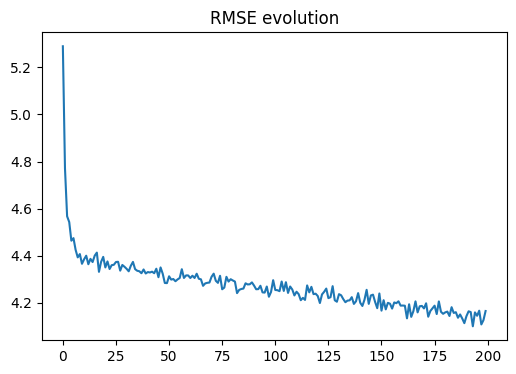


Training and evaluating model with 14 days of previous rain data:
Epoch 1/200
40/40 [==============================] - 1s 2ms/step - loss: 24.5909
Epoch 2/200
40/40 [==============================] - 0s 2ms/step - loss: 19.5432
Epoch 3/200
40/40 [==============================] - 0s 2ms/step - loss: 18.0973
Epoch 4/200
40/40 [==============================] - 0s 2ms/step - loss: 17.9049
Epoch 5/200
40/40 [==============================] - 0s 2ms/step - loss: 17.8038
Epoch 6/200
40/40 [==============================] - 0s 2ms/step - loss: 17.2726
Epoch 7/200
40/40 [==============================] - 0s 2ms/step - loss: 17.1920
Epoch 8/200
40/40 [==============================] - 0s 2ms/step - loss: 16.7637
Epoch 9/200
40/40 [==============================] - 0s 2ms/step - loss: 16.7535
Epoch 10/200
40/40 [==============================] - 0s 2ms/step - loss: 17.2478
Epoch 11/200
40/40 [==============================] - 0s 2ms/step - loss: 16.8498
Epoch 12/200
40/40 [====================

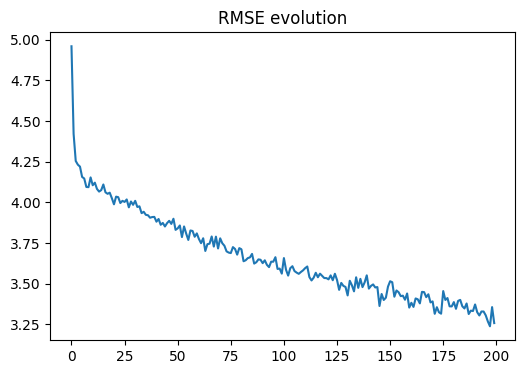


Training and evaluating model with 21 days of previous rain data:
Epoch 1/200
40/40 [==============================] - 1s 2ms/step - loss: 25.8548
Epoch 2/200
40/40 [==============================] - 0s 2ms/step - loss: 20.9343
Epoch 3/200
40/40 [==============================] - 0s 2ms/step - loss: 20.0300
Epoch 4/200
40/40 [==============================] - 0s 2ms/step - loss: 19.8882
Epoch 5/200
40/40 [==============================] - 0s 2ms/step - loss: 19.6945
Epoch 6/200
40/40 [==============================] - 0s 2ms/step - loss: 19.5266
Epoch 7/200
40/40 [==============================] - 0s 2ms/step - loss: 19.2850
Epoch 8/200
40/40 [==============================] - 0s 2ms/step - loss: 19.0266
Epoch 9/200
40/40 [==============================] - 0s 2ms/step - loss: 18.8837
Epoch 10/200
40/40 [==============================] - 0s 2ms/step - loss: 18.5581
Epoch 11/200
40/40 [==============================] - 0s 2ms/step - loss: 18.6909
Epoch 12/200
40/40 [====================

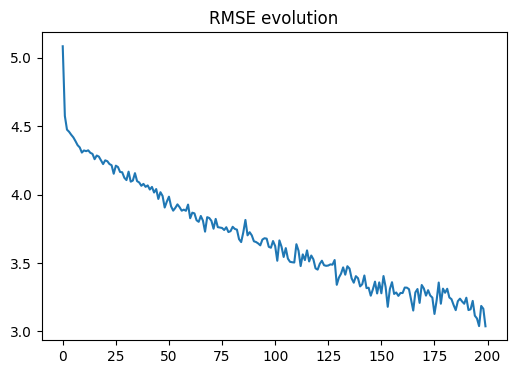


Training and evaluating model with 28 days of previous rain data:
Epoch 1/200
40/40 [==============================] - 1s 2ms/step - loss: 24.2341
Epoch 2/200
40/40 [==============================] - 0s 3ms/step - loss: 19.0381
Epoch 3/200
40/40 [==============================] - 0s 3ms/step - loss: 18.2669
Epoch 4/200
40/40 [==============================] - 0s 2ms/step - loss: 18.0306
Epoch 5/200
40/40 [==============================] - 0s 2ms/step - loss: 17.7949
Epoch 6/200
40/40 [==============================] - 0s 3ms/step - loss: 17.6344
Epoch 7/200
40/40 [==============================] - 0s 4ms/step - loss: 17.3886
Epoch 8/200
40/40 [==============================] - 0s 5ms/step - loss: 17.0361
Epoch 9/200
40/40 [==============================] - 0s 4ms/step - loss: 16.8431
Epoch 10/200
40/40 [==============================] - 0s 5ms/step - loss: 16.8865
Epoch 11/200
40/40 [==============================] - 0s 3ms/step - loss: 16.7830
Epoch 12/200
40/40 [====================

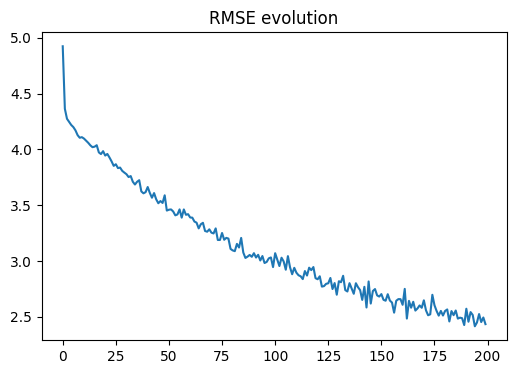

In [13]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

def train_and_evaluate_model(days):
    # Step 1: Prepare the Data
    # Create rain_previous_day columns
    for i in range(1, days+1):
        county_clare[f'rain_previous_day_{i}'] = county_clare['rain'].shift(i)

    # Extract relevant features and target variable
    features = [f'rain_previous_day_{i}' for i in range(1, days+1)] + ['date']
    target = 'rain'
    data = county_clare[features + [target]].copy()

    # Convert date to ordinal
    data['date'] = pd.to_datetime(data['date']).apply(lambda x: x.toordinal())

    # Drop rows with missing values
    data.dropna(inplace=True)

    # Step 2: Split the Data
    X = data[features]
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Scale the data
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Step 3: Build the Neural Network Model
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error', optimizer='adam')

    # Step 4: Train the Model
    history = model.fit(X_train, y_train, epochs=200, batch_size=32, verbose=1)

    # Step 5: Evaluate the Model
    y_pred = model.predict(X_test)
    mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
    rmse = tf.sqrt(mse)

    # Plot RMSE for each epoch
    plt.figure(figsize=(6, 4))
    plt.plot(np.sqrt(history.history['loss']), label='RMSE')
    plt.title('RMSE evolution')
    plt.show()

# Test the function with different numbers of days
for days in [7, 14, 21, 28]:
    print(f"\nTraining and evaluating model with {days} days of previous rain data:")
    train_and_evaluate_model(days)



Training and evaluating model with 7 days of previous rain data:
Epoch 1/200
40/40 [==============================] - 1s 3ms/step - loss: 27.5728
Epoch 2/200
40/40 [==============================] - 0s 2ms/step - loss: 22.1117
Epoch 3/200
40/40 [==============================] - 0s 2ms/step - loss: 20.3930
Epoch 4/200
40/40 [==============================] - 0s 2ms/step - loss: 19.8349
Epoch 5/200
40/40 [==============================] - 0s 3ms/step - loss: 19.7459
Epoch 6/200
40/40 [==============================] - 0s 2ms/step - loss: 19.5194
Epoch 7/200
40/40 [==============================] - 0s 2ms/step - loss: 19.3453
Epoch 8/200
40/40 [==============================] - 0s 2ms/step - loss: 19.3542
Epoch 9/200
40/40 [==============================] - 0s 2ms/step - loss: 19.2924
Epoch 10/200
40/40 [==============================] - 0s 1ms/step - loss: 19.3224
Epoch 11/200
40/40 [==============================] - 0s 2ms/step - loss: 19.1799
Epoch 12/200
40/40 [=====================

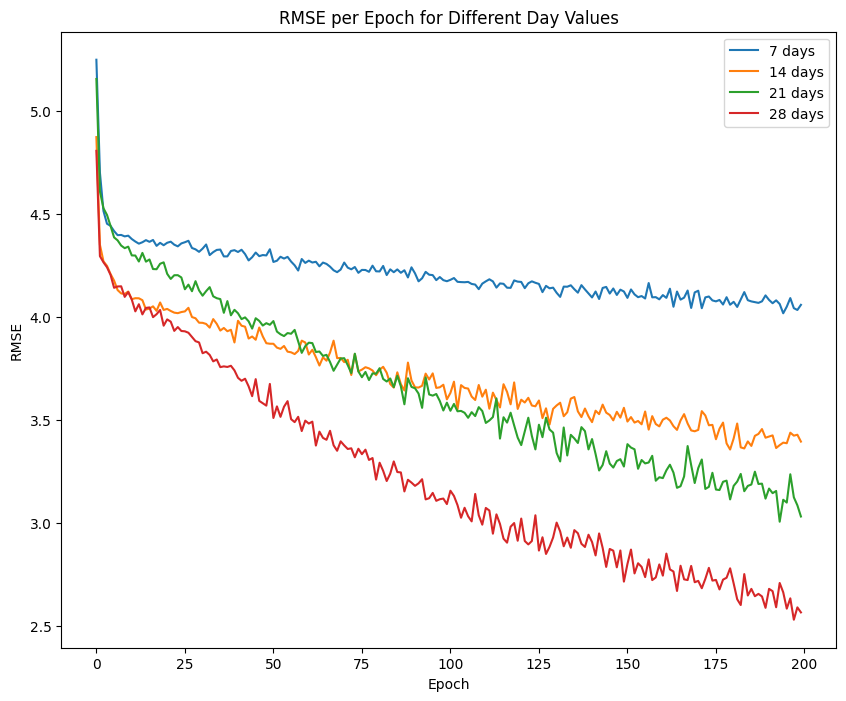

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

# Initialize a dictionary to store RMSE values for each 'days' value
rmse_per_epoch_per_days = {}

def train_and_evaluate_model(days):
    # Step 1: Prepare the Data
    # Create rain_previous_day columns
    for i in range(1, days+1):
        county_clare[f'rain_previous_day_{i}'] = county_clare['rain'].shift(i)

    # Extract relevant features and target variable
    features = [f'rain_previous_day_{i}' for i in range(1, days+1)] + ['date']
    target = 'rain'
    data = county_clare[features + [target]].copy()

    # Convert date to ordinal
    data['date'] = pd.to_datetime(data['date']).apply(lambda x: x.toordinal())

    # Drop rows with missing values
    data.dropna(inplace=True)

    # Step 2: Split the Data
    X = data[features]
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Scale the data
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Step 3: Build the Neural Network Model
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error', optimizer='adam')

    # Step 4: Train the Model
    history = model.fit(X_train, y_train, epochs=200, batch_size=32, verbose=1)

    # Step 5: Evaluate the Model
    y_pred = model.predict(X_test)
    mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
    rmse = tf.sqrt(mse)

    # Store RMSE values for each epoch in the dictionary
    rmse_per_epoch_per_days[days] = np.sqrt(history.history['loss'])

# Define a function to plot all RMSE values
def plot_rmse(rmse_per_epoch_per_days):
    plt.figure(figsize=(10, 8))
    for days, rmse_values in rmse_per_epoch_per_days.items():
        plt.plot(rmse_values, label=f'{days} days')

    plt.title('RMSE per Epoch for Different Day Values')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()

# Assuming 'county_clare' is your DataFrame with the necessary data
# Test the function with different numbers of days
for days in [7, 14, 21, 28]:
    print(f"\nTraining and evaluating model with {days} days of previous rain data:")
    train_and_evaluate_model(days)

# After all models are trained, plot the RMSE values
plot_rmse(rmse_per_epoch_per_days)



Training and evaluating model with 7 days of previous rain data:
Epoch 1/1200
40/40 [==============================] - 1s 2ms/step - loss: 26.6516
Epoch 2/1200
40/40 [==============================] - 0s 2ms/step - loss: 21.8444
Epoch 3/1200
40/40 [==============================] - 0s 2ms/step - loss: 20.9031
Epoch 4/1200
40/40 [==============================] - 0s 2ms/step - loss: 20.2412
Epoch 5/1200
40/40 [==============================] - 0s 2ms/step - loss: 19.8788
Epoch 6/1200
40/40 [==============================] - 0s 2ms/step - loss: 19.7740
Epoch 7/1200
40/40 [==============================] - 0s 2ms/step - loss: 19.3371
Epoch 8/1200
40/40 [==============================] - 0s 2ms/step - loss: 19.4092
Epoch 9/1200
40/40 [==============================] - 0s 1ms/step - loss: 19.0997
Epoch 10/1200
40/40 [==============================] - 0s 1ms/step - loss: 19.3026
Epoch 11/1200
40/40 [==============================] - 0s 2ms/step - loss: 19.1851
Epoch 12/1200
40/40 [=========

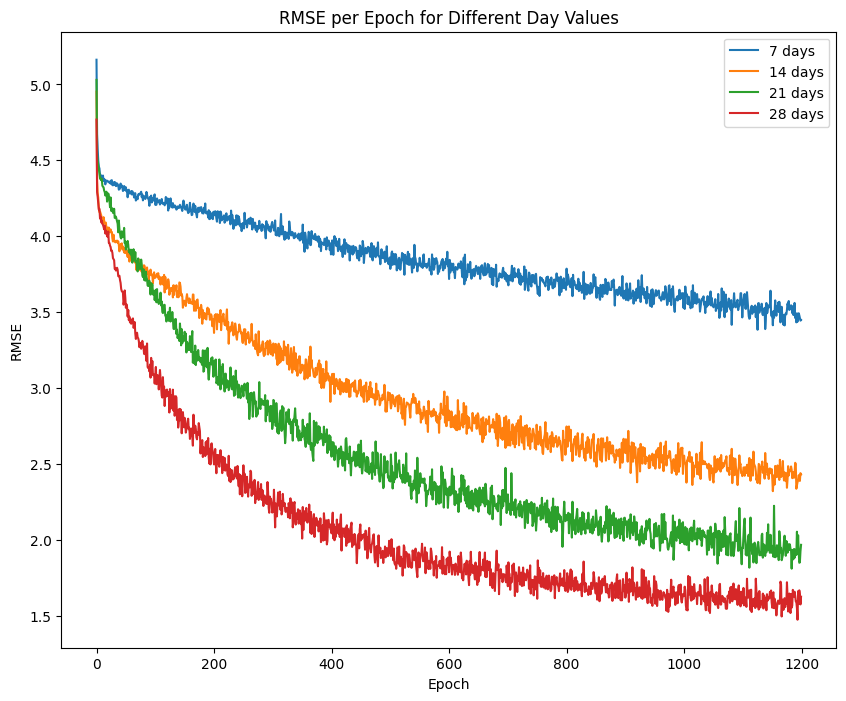

In [16]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

# Initialize a dictionary to store RMSE values for each 'days' value
rmse_per_epoch_per_days = {}

def train_and_evaluate_model(days):
    # Step 1: Prepare the Data
    # Create rain_previous_day columns
    for i in range(1, days+1):
        county_clare[f'rain_previous_day_{i}'] = county_clare['rain'].shift(i)

    # Extract relevant features and target variable
    features = [f'rain_previous_day_{i}' for i in range(1, days+1)] + ['date']
    target = 'rain'
    data = county_clare[features + [target]].copy()

    # Convert date to ordinal
    data['date'] = pd.to_datetime(data['date']).apply(lambda x: x.toordinal())

    # Drop rows with missing values
    data.dropna(inplace=True)

    # Step 2: Split the Data
    X = data[features]
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Scale the data
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Step 3: Build the Neural Network Model
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error', optimizer='adam')

    # Step 4: Train the Model
    history = model.fit(X_train, y_train, epochs=1200, batch_size=32, verbose=1)

    # Step 5: Evaluate the Model
    y_pred = model.predict(X_test)
    mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
    rmse = tf.sqrt(mse)

    # Store RMSE values for each epoch in the dictionary
    rmse_per_epoch_per_days[days] = np.sqrt(history.history['loss'])

# Define a function to plot all RMSE values
def plot_rmse(rmse_per_epoch_per_days):
    plt.figure(figsize=(10, 8))
    for days, rmse_values in rmse_per_epoch_per_days.items():
        plt.plot(rmse_values, label=f'{days} days')

    plt.title('RMSE per Epoch for Different Day Values')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()

# Assuming 'county_clare' is your DataFrame with the necessary data
# Test the function with different numbers of days
for days in [7, 14, 21, 28]:
    print(f"\nTraining and evaluating model with {days} days of previous rain data:")
    train_and_evaluate_model(days)

# After all models are trained, plot the RMSE values
plot_rmse(rmse_per_epoch_per_days)
